**Set the Colab GPU**

Go to Edit > Notebook settings as the following:

Click on “Notebook settings” and select “GPU” from Hardware *accelerator*. That's it.

**Connect Colab with Google Drive**

In [23]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [24]:
!python -m pip install pyyaml==5.1

# Properly install detectron2.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities
#(e.g. compiled operators).
#(Please do not install twice in both ways)
#!git clone 'https://github.com/facebookresearch/detectron2'
#dist = distutils.core.run_setup("./detectron2/setup.py")
#!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
#sys.path.insert(0, os.path.abspath('./detectron2'))

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-9ocn4211
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-9ocn4211
  Resolved https://github.com/facebookresearch/detectron2.git to commit 3eef7a58ad5bf78c2dadd184e94fc65f31804196
  Preparing metadata (setup.py) ... done


In [25]:
import detectron2

# Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common detectron2 utilities
#https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# import some common libraries
import numpy as np
import torch, os, json, cv2, random
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow




**Balloon Dataset**

In [26]:
#https://github.com/matterport/Mask_RCNN/releases/download/v2.1/balloon_dataset.zip

balloonData_path = '/content/drive/My Drive/Colab Notebooks/balloon/'

In [27]:
balloonData_path

'/content/drive/My Drive/Colab Notebooks/balloon/'

In [28]:
# if your dataset is in COCO format, then write the following three lines:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

AssertionError: Dataset 'my_dataset_train' is already registered!

In [29]:
#function to parse and prepare bolloon dataset into detectron2's standard format

from detectron2.structures import BoxMode

def get_balloon_dicts(balloonData_path):
    json_file = os.path.join(balloonData_path, "via_region_data.json")
    with open(json_file) as f:
        imgs_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns.values()):
        record = {}

        filename = os.path.join(balloonData_path, v["filename"])
        height, width = cv2.imread(filename).shape[:2]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v["regions"]
        objs = []
        for _, anno in annos.items():
            assert not anno["region_attributes"]
            anno = anno["shape_attributes"]
            px = anno["all_points_x"]
            py = anno["all_points_y"]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [30]:
#Register the balloon dataset to detectron2

from detectron2.data import DatasetCatalog

for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts(balloonData_path + d))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])

balloon_metadata = MetadataCatalog.get("balloon_train")

AssertionError: Dataset 'balloon_train' is already registered!

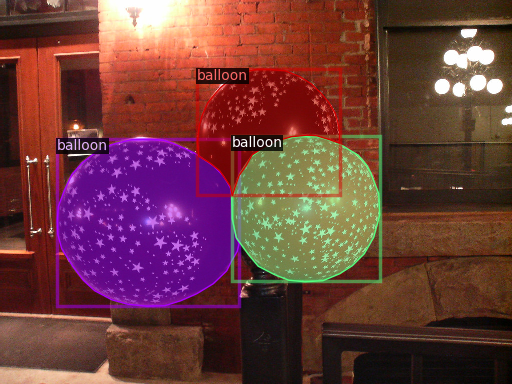

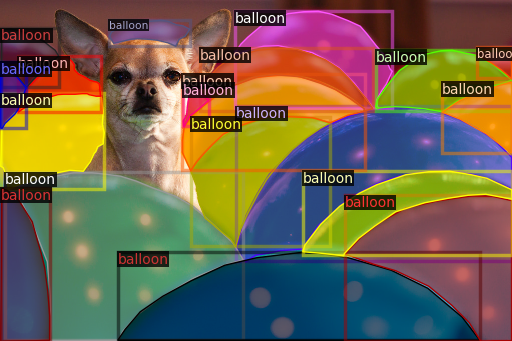

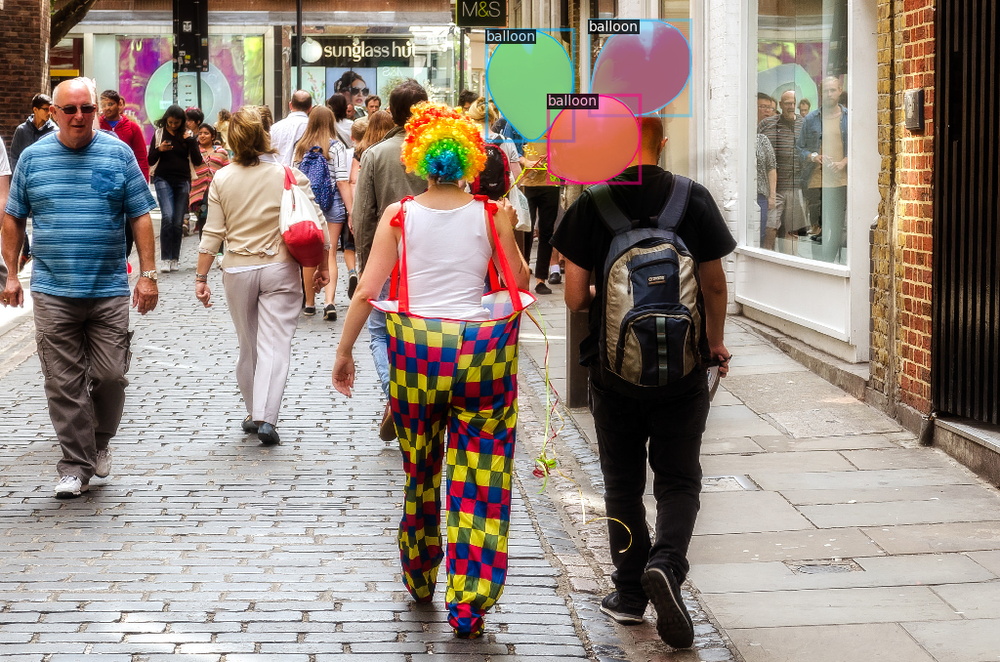

In [31]:
dataset_dicts = get_balloon_dicts(balloonData_path + "train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Instance Segmentation and Object Detection with Custom Dataset using Mask R-CNN

In [32]:
# https://github.com/facebookresearch/detectron2/tree/main/configs/COCO-InstanceSegmentation

from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()




[05/02 09:30:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 119MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/02 09:30:57 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/02 09:31:11 d2.utils.events]:  eta: 0:03:47  iter: 19  total_loss: 2.078  loss_cls: 0.7288  loss_box_reg: 0.5818  loss_mask: 0.6978  loss_rpn_cls: 0.02563  loss_rpn_loc: 0.007033    time: 0.4859  last_time: 0.5202  data_time: 0.0214  last_data_time: 0.0198   lr: 9.7405e-06  max_mem: 2455M
[05/02 09:31:25 d2.utils.events]:  eta: 0:03:42  iter: 39  total_loss: 2.04  loss_cls: 0.6332  loss_box_reg: 0.6664  loss_mask: 0.6379  loss_rpn_cls: 0.02487  loss_rpn_loc: 0.007278    time: 0.4907  last_time: 0.4147  data_time: 0.0099  last_data_time: 0.0050   lr: 1.9731e-05  max_mem: 2457M
[05/02 09:31:34 d2.utils.events]:  eta: 0:03:32  iter: 59  total_loss: 1.826  loss_cls: 0.5412  loss_box_reg: 0.651  loss_mask: 0.5493  loss_rpn_cls: 0.0463  loss_rpn_loc: 0.009997    time: 0.4873  last_time: 0.4151  data_time: 0.0092  last_data_time: 0.0056   lr: 2.972e-05  max_mem: 2577M
[05/02 09:31:45 d2.utils.events]:  eta: 0:03:25  iter: 79  total_loss: 1.582  loss_cls: 0.4307  loss_box_reg: 0.6587  loss

In [33]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

# Inference & evaluation using the trained model

In [34]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("balloon_val", )
predictor = DefaultPredictor(cfg)

[05/02 09:35:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


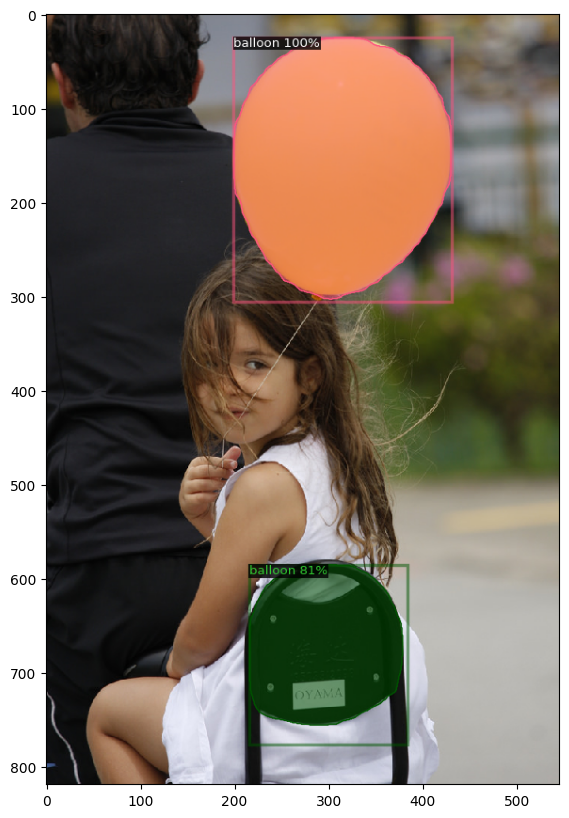

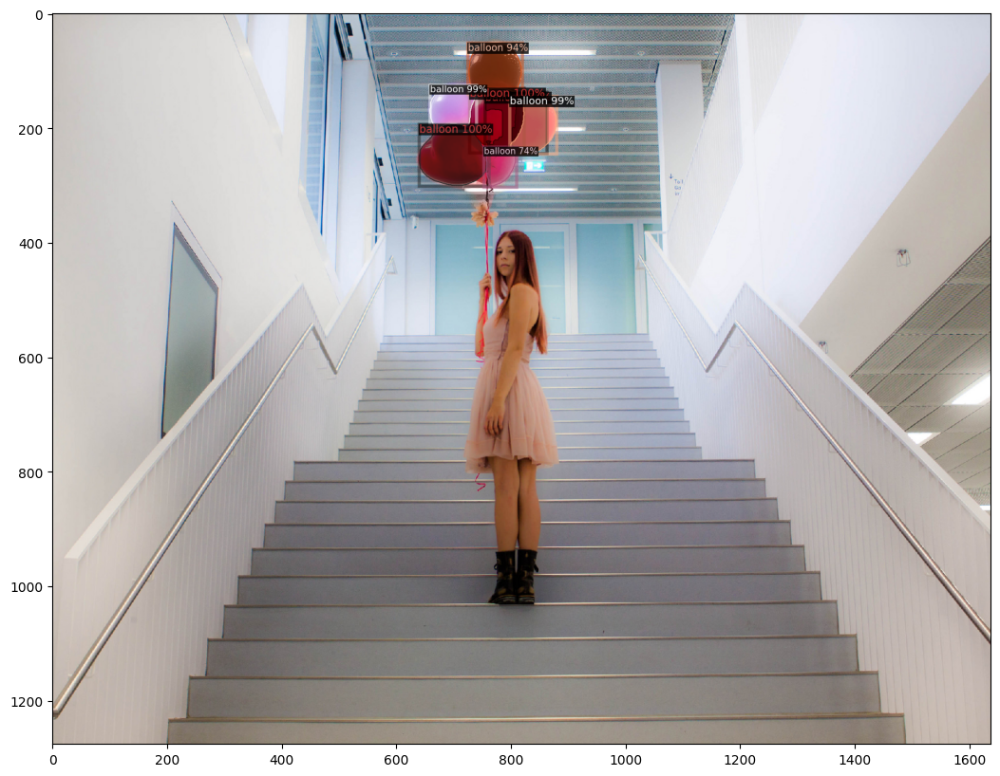

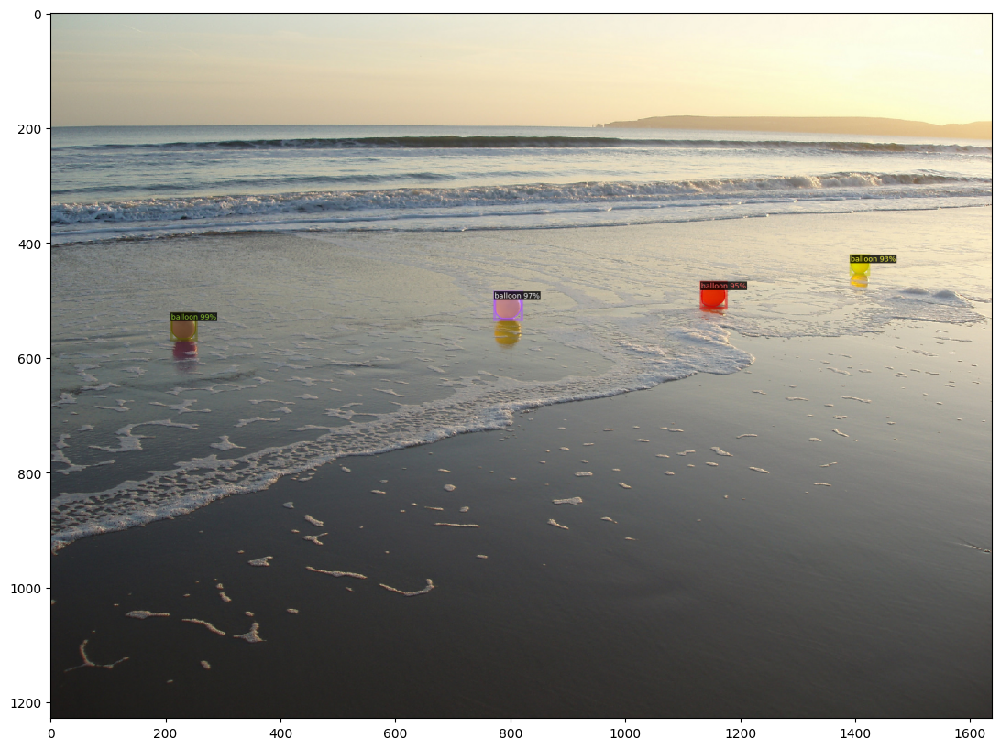

In [35]:

dataset_dicts = get_balloon_dicts(balloonData_path + "val")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

 **Performance Metric**

 Evaluate the performance of Trained Mask RCNN using Intersection over Union (IOU) and Average Precision (AP) metrics implemented in COCO API.

In [36]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("balloon_val", ("bbox",), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "balloon_val")

print(inference_on_dataset(trainer.model, val_loader, evaluator))

[05/02 09:36:07 d2.evaluation.coco_evaluation]: Trying to convert 'balloon_val' to COCO format ...
[05/02 09:36:07 d2.data.datasets.coco]: Converting annotations of dataset 'balloon_val' to COCO format ...)
[05/02 09:36:07 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[05/02 09:36:07 d2.data.datasets.coco]: Conversion finished, #images: 13, #annotations: 50
[05/02 09:36:07 d2.data.datasets.coco]: Caching COCO format annotations at './output/balloon_val_coco_format.json' ...
[05/02 09:36:08 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  balloon   | 50           |
|            |              |
[05/02 09:36:08 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/02 09:36:08 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[0

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/02 09:36:12 d2.evaluation.evaluator]: Inference done 11/13. Dataloading: 0.0020 s/iter. Inference: 0.1471 s/iter. Eval: 0.0291 s/iter. Total: 0.1783 s/iter. ETA=0:00:00
[05/02 09:36:12 d2.evaluation.evaluator]: Total inference time: 0:00:01.422766 (0.177846 s / iter per device, on 1 devices)
[05/02 09:36:12 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.138745 s / iter per device, on 1 devices)
[05/02 09:36:12 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/02 09:36:12 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/02 09:36:12 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/02 09:36:12 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/02 09:36:12 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/02 09:36:12 d2.evaluation.